In [103]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [2]:
def mostrar_imagen(image, title='Imagen'):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image_rgb)
    plt.title(title)
    plt.axis('off')
    plt.show()

In [3]:
imagenes_rutas = [f'./imagenes/{i}.png' for i in range(11)]

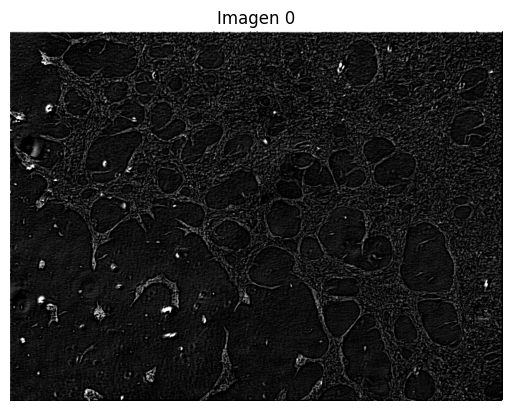

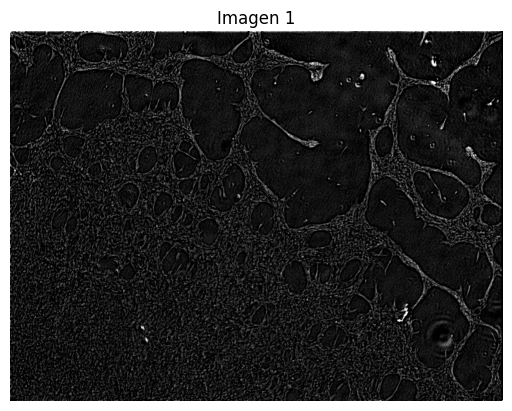

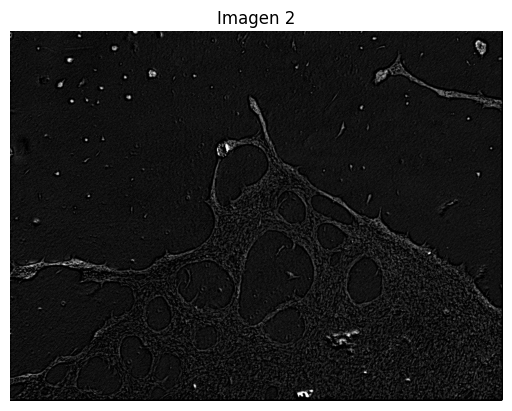

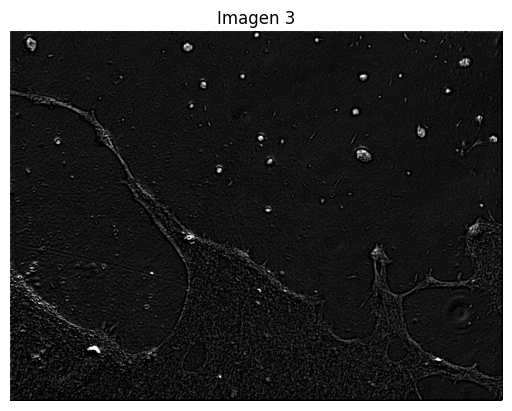

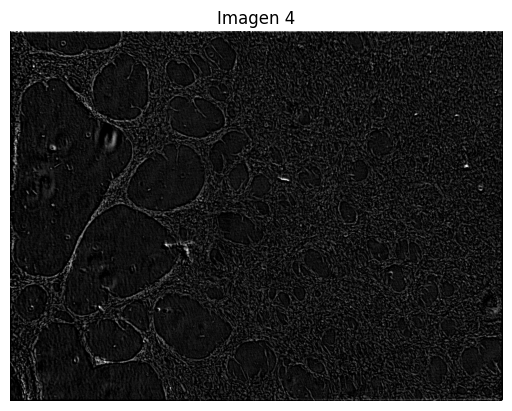

...

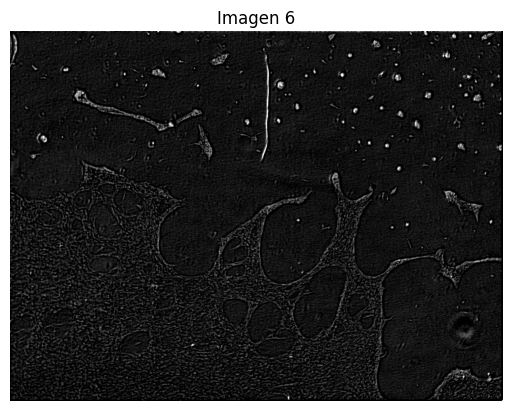

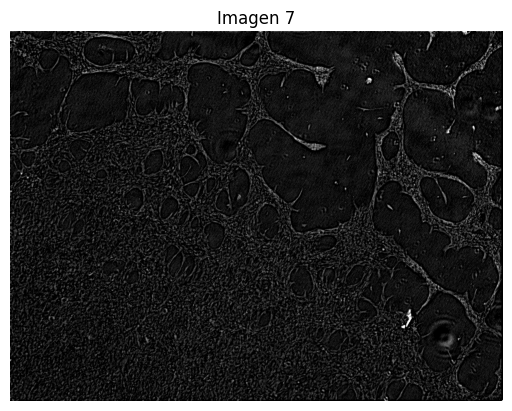

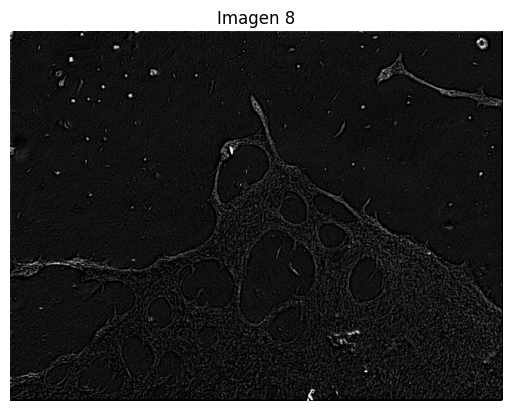

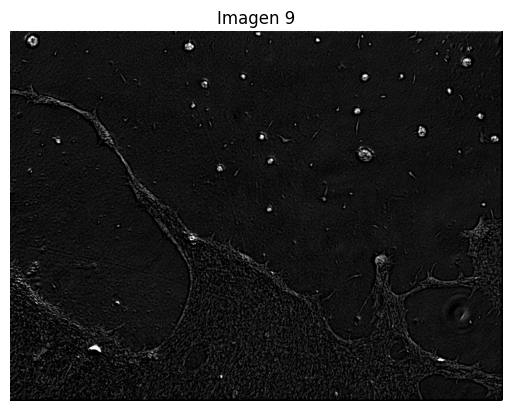

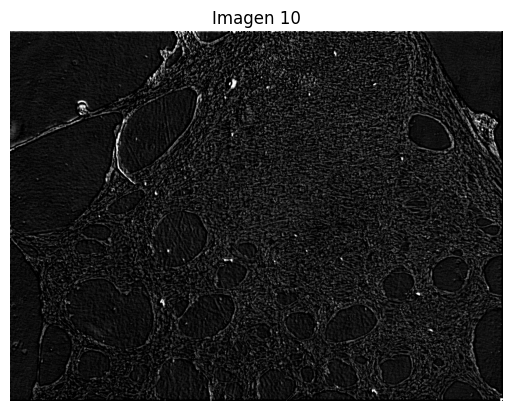

In [4]:
# Mostrar Imagenes Originales

for i, ruta in enumerate(imagenes_rutas):
    imagen = cv2.imread(ruta)

    if imagen is None:
        print(f"No se pudo cargar la imagen en {ruta}")
    else:
        mostrar_imagen(imagen, title=f'Imagen {i}')


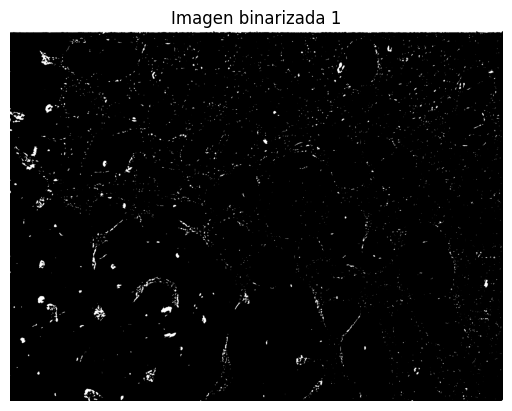

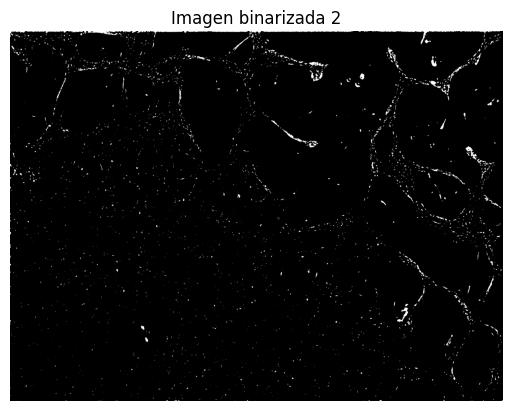

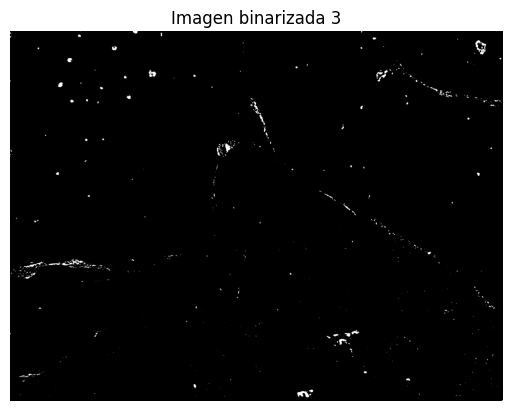

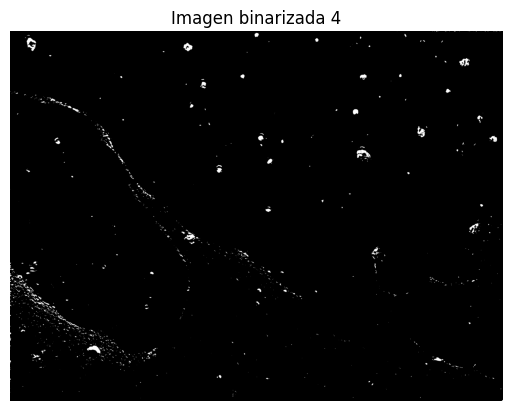

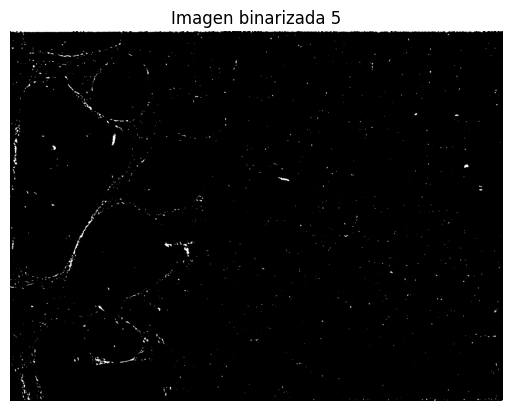

...

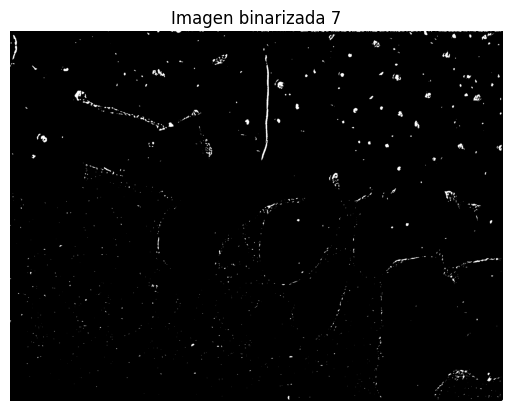

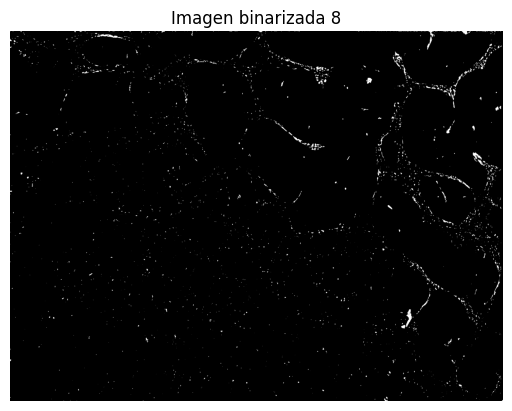

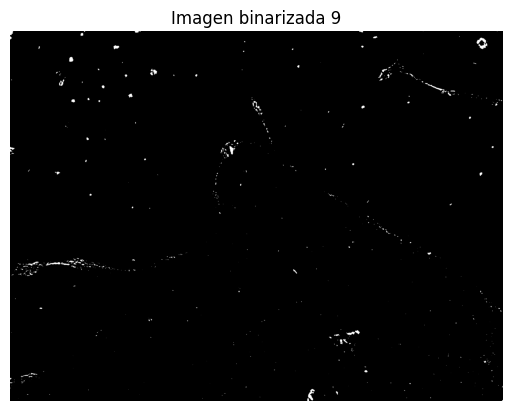

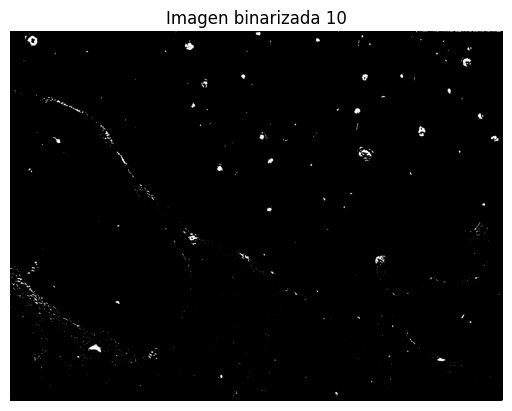

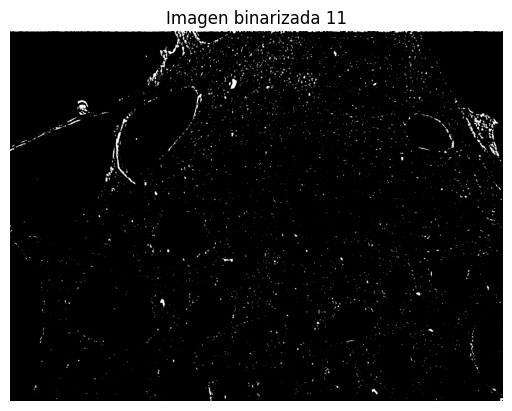

In [68]:
# Imagenes binarizadas
umbral = 100
imagenes_binarizadas = []

for i, ruta in enumerate(imagenes_rutas):
    imagen = cv2.imread(ruta, cv2.IMREAD_GRAYSCALE)

    if imagen is None:
        print(f"No se pudo cargar la imagen en {ruta}")
    else:
        _, imagen_binarizada = cv2.threshold(imagen, umbral, 255, cv2.THRESH_BINARY)
        imagenes_binarizadas.append(imagen_binarizada)
        mostrar_imagen(imagen_binarizada, title=f'Imagen binarizada {i+1}')

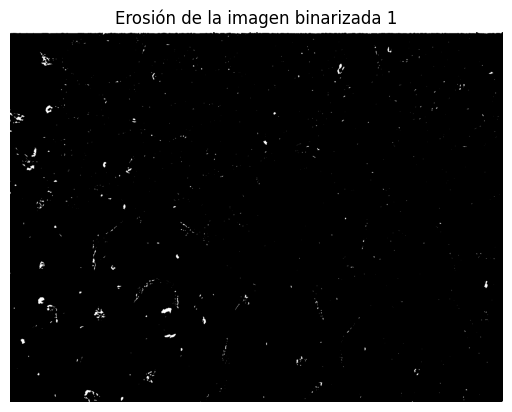

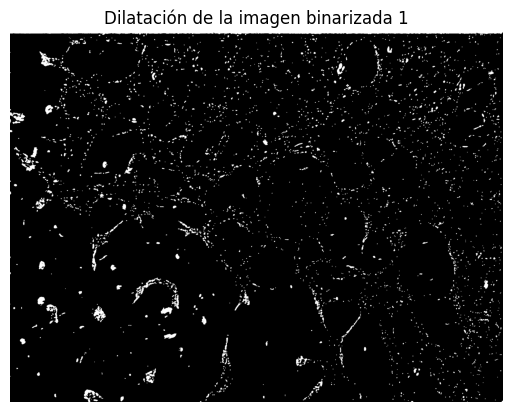

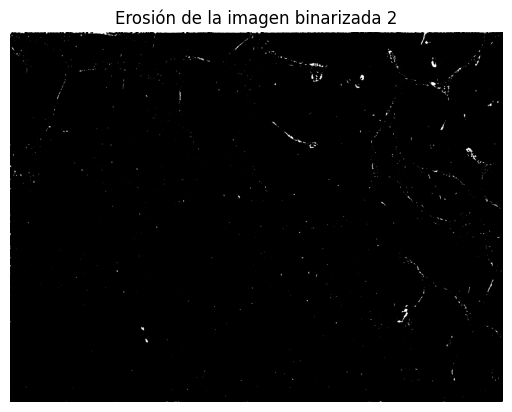

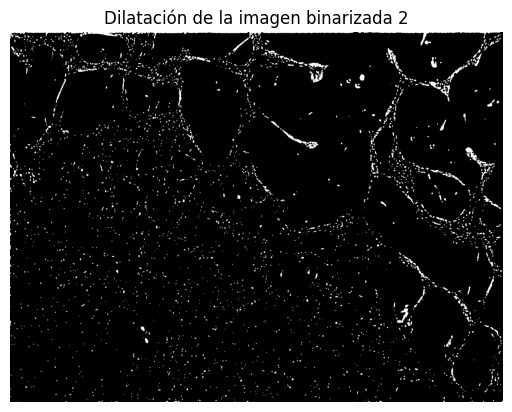

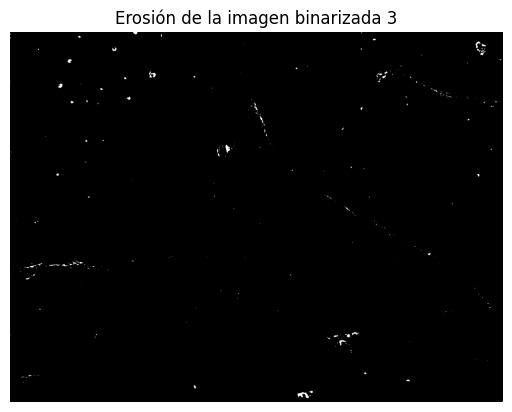

...

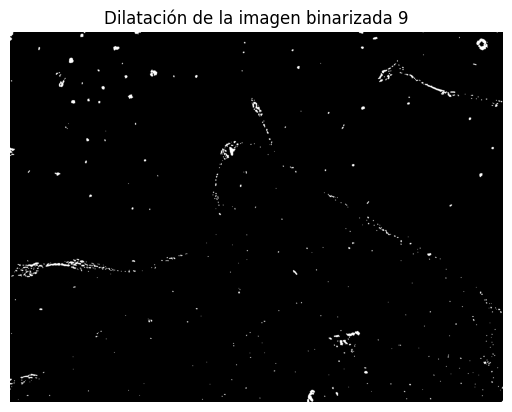

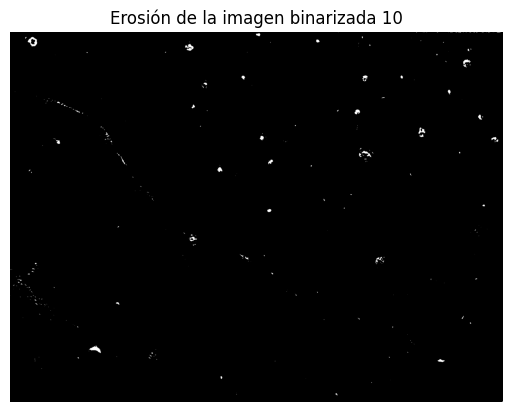

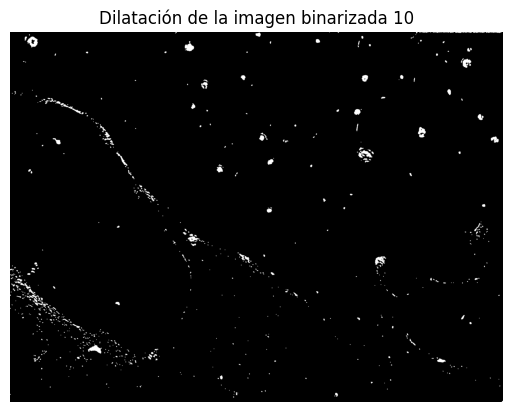

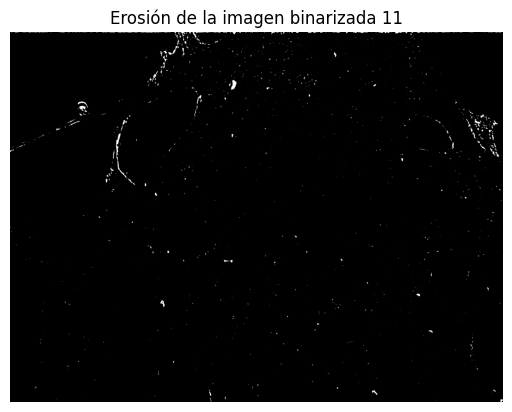

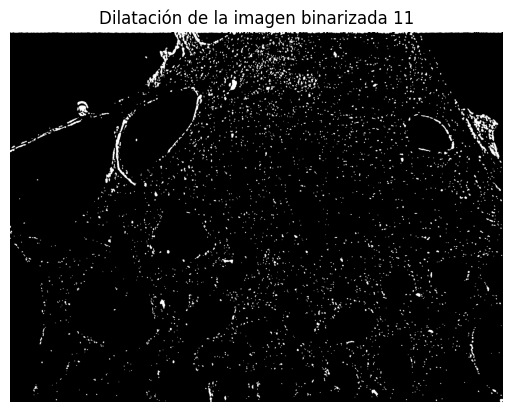

In [102]:
kernel = np.ones((3, 3), np.uint8)
imagenes_dilatadas = []

for i, imagen_binarizada in enumerate(imagenes_binarizadas):
    # Erosión
    imagen_erodida = cv2.erode(imagen_binarizada, kernel, iterations=1)
    mostrar_imagen(imagen_erodida, title=f'Erosión de la imagen binarizada {i+1}')

    # Dilatación
    imagen_dilatada = cv2.dilate(imagen_binarizada, kernel, iterations=1)
    imagenes_dilatadas.append(imagen_dilatada)
    mostrar_imagen(imagen_dilatada, title=f'Dilatación de la imagen binarizada {i+1}')

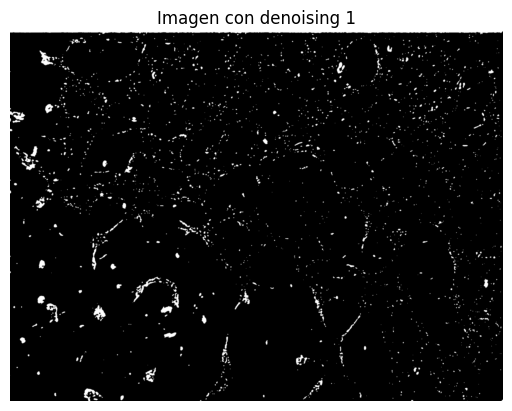

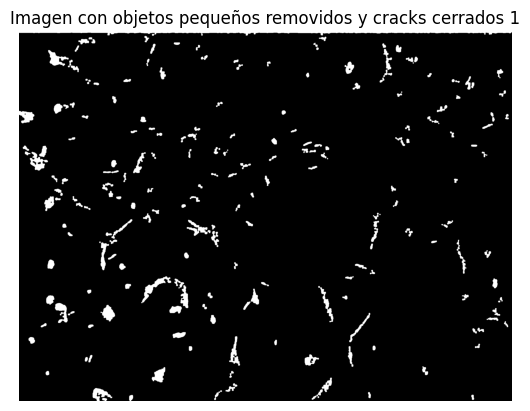

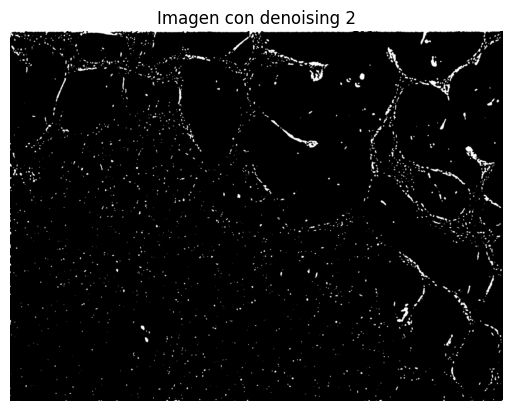

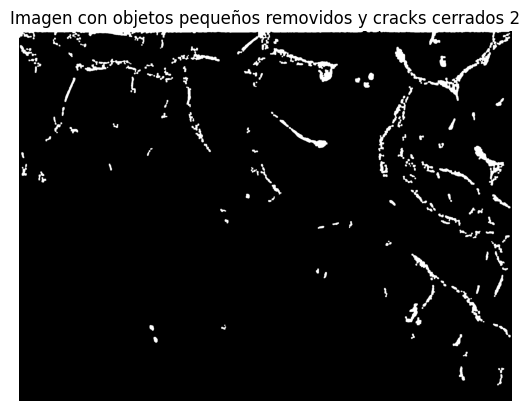

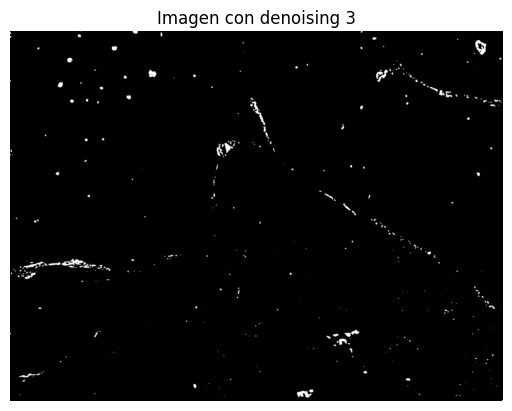

...

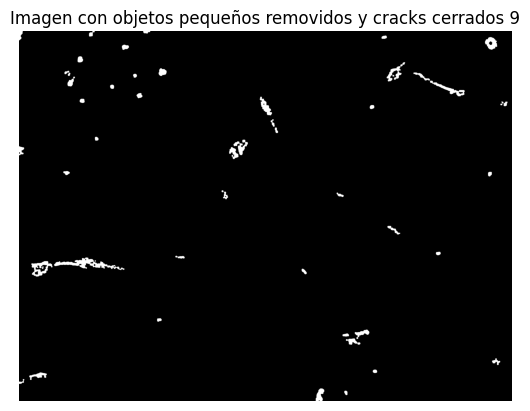

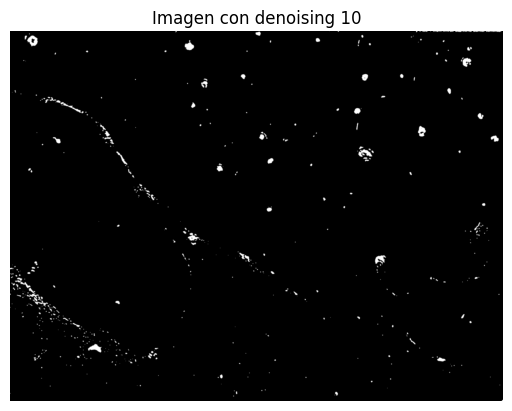

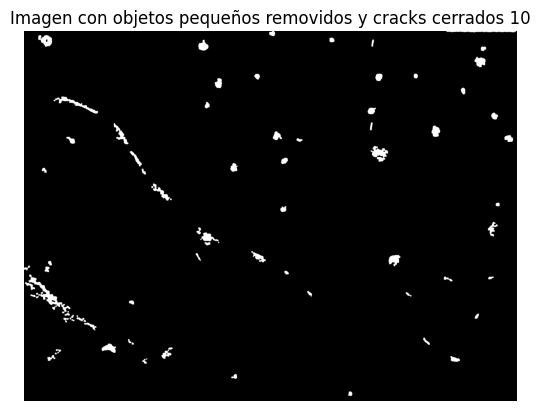

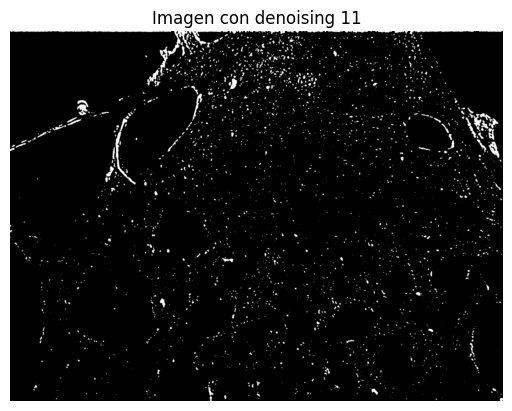

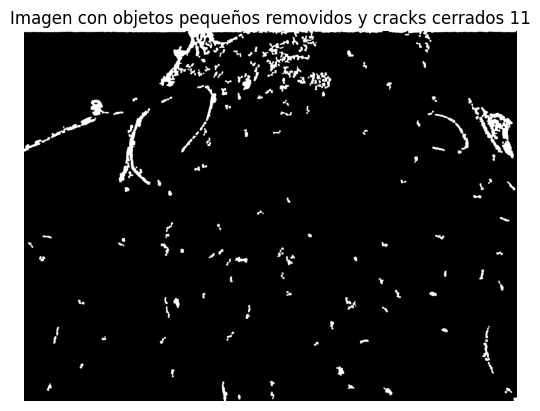

In [95]:
kernel_cierre = np.ones((5, 5), np.uint8)
imagenes_denoised = []

for i, imagen_dilatada in enumerate(imagenes_dilatadas):
    imagen_denoised = cv2.fastNlMeansDenoising(imagen_dilatada, None, 7, 21)
    imagen_suavizada = cv2.medianBlur(imagen_denoised, 5)
    imagen_suavizada_blur = cv2.GaussianBlur(imagen_suavizada, (5, 5), 0)
    mostrar_imagen(imagen_suavizada_blur, title=f'Imagen con denoising {i+1}')

    imagen_cierre = cv2.morphologyEx(imagen_suavizada_blur, cv2.MORPH_CLOSE, kernel_cierre)


    num_labels, labels_im, stats, centroids = cv2.connectedComponentsWithStats(imagen_cierre)
    imagen_filtrada = np.zeros_like(imagen_cierre)

    for label in range(1, num_labels): 
        area = stats[label, cv2.CC_STAT_AREA]
        if area > 300:  
            imagen_filtrada[labels_im == label] = 255

    imagenes_denoised.append(imagen_filtrada)
    mostrar_imagen(imagen_filtrada, title=f'Imagen con objetos pequeños removidos y cracks cerrados {i+1}')


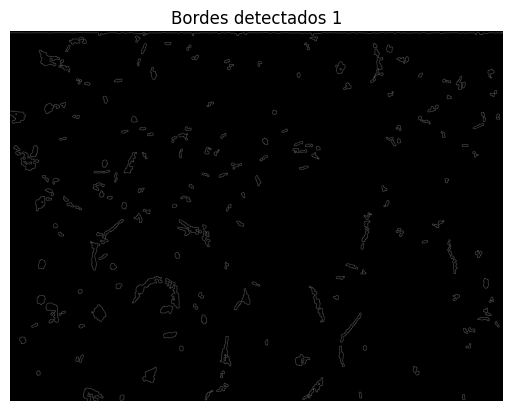

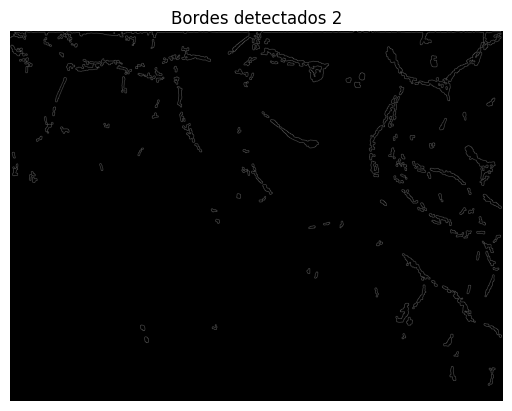

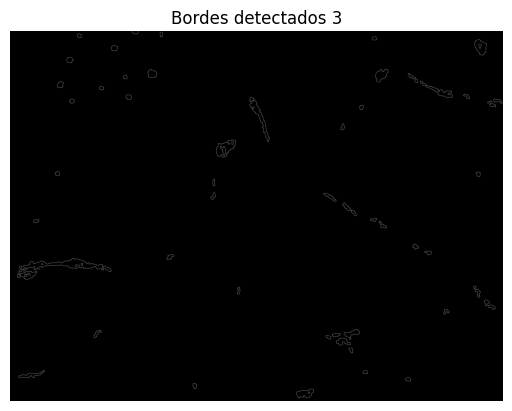

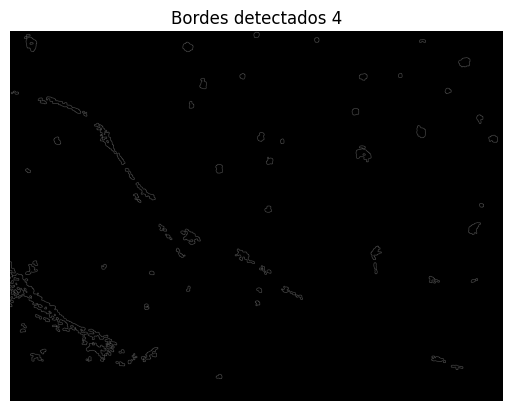

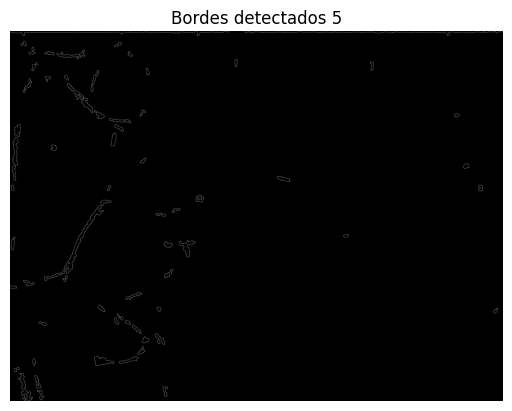

...

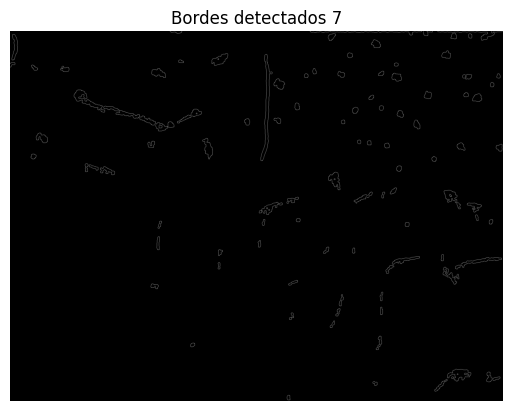

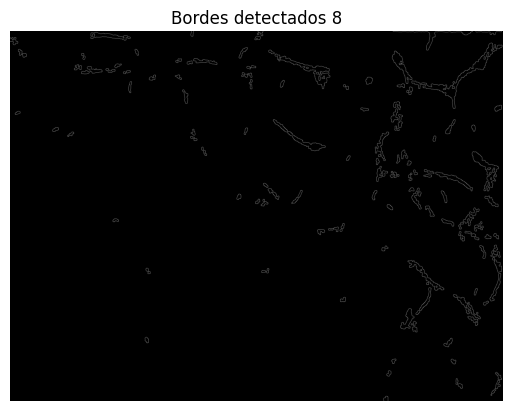

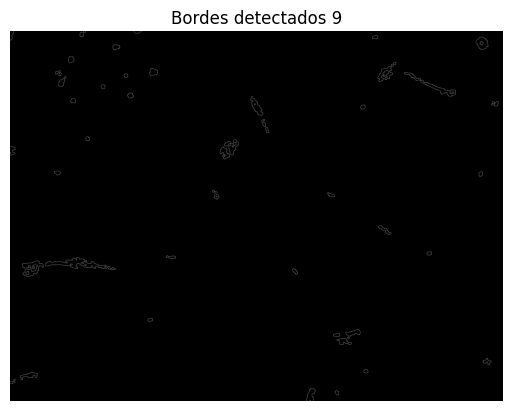

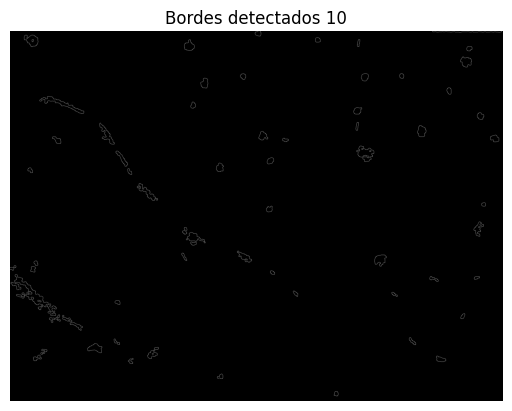

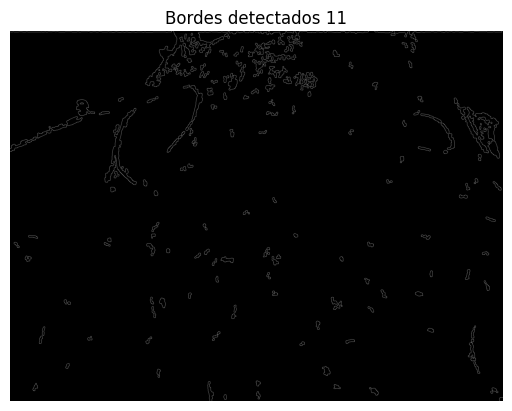

In [97]:
imagenes_bordes = []

for i, imagen_suavizada in enumerate(imagenes_denoised):
    imagen_bordes = cv2.Canny(imagen_suavizada, 100, 200)
    imagenes_bordes.append(imagen_bordes)
    mostrar_imagen(imagen_bordes, title=f'Bordes detectados {i+1}')

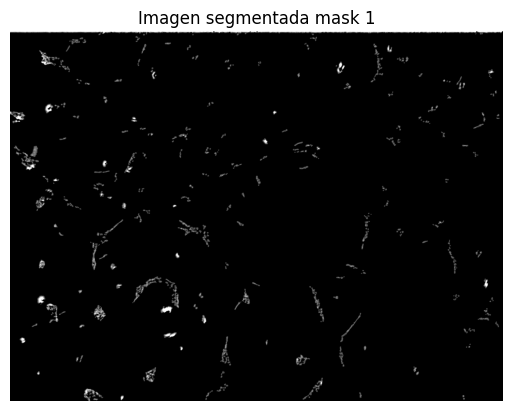

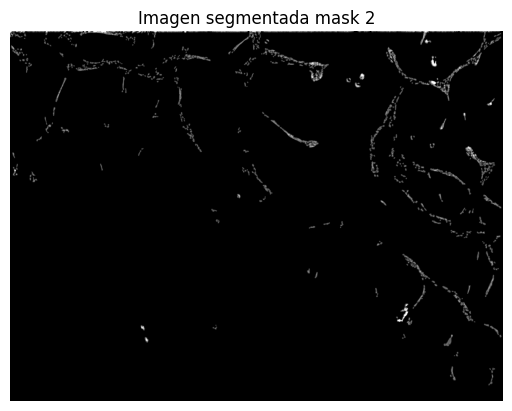

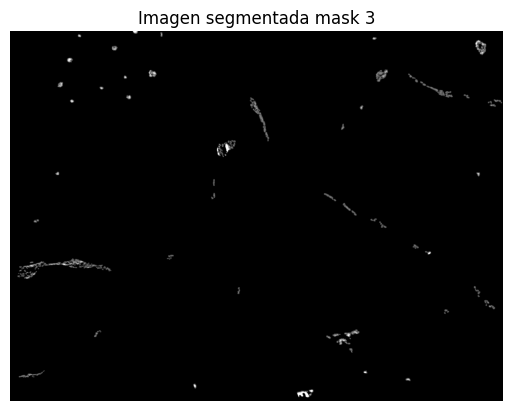

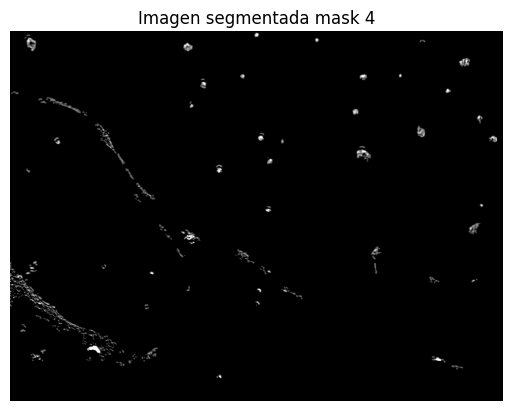

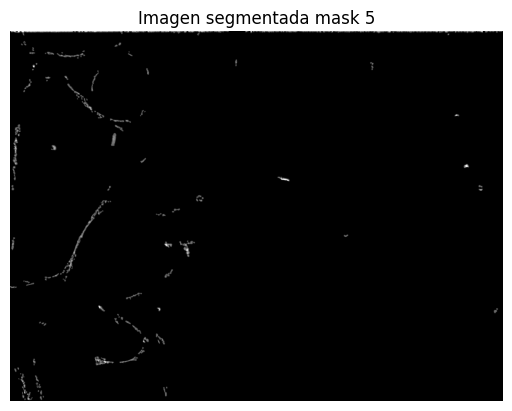

...

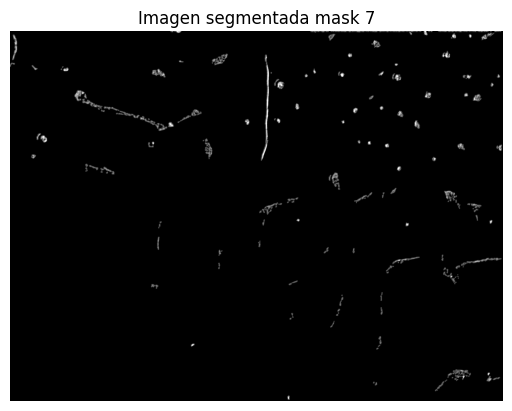

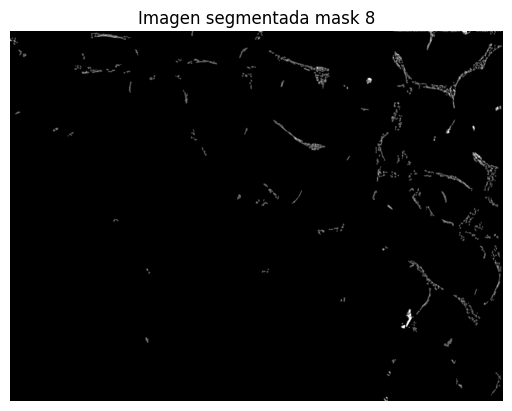

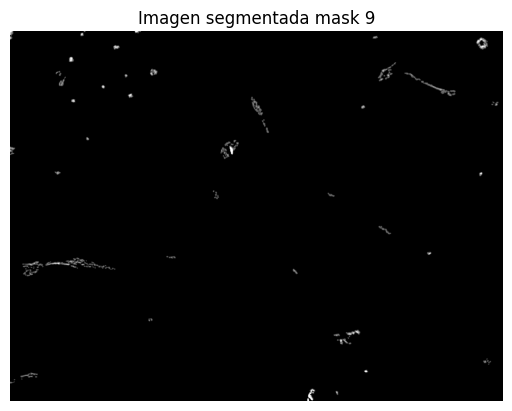

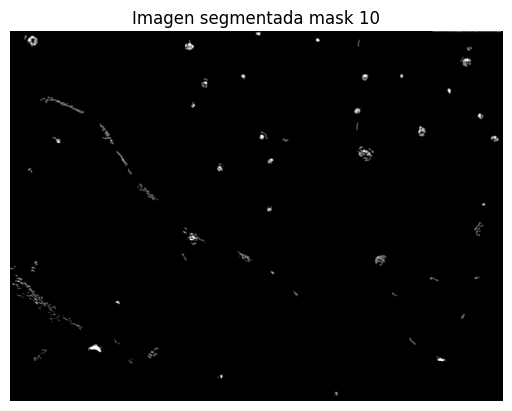

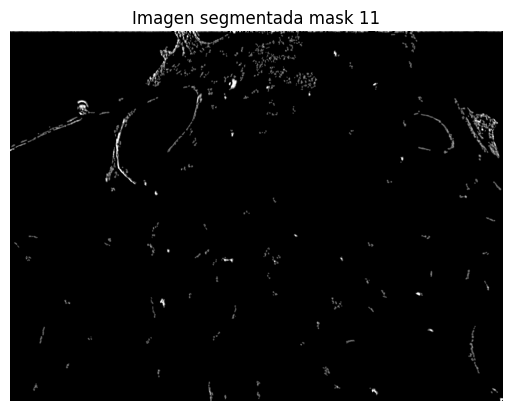

In [101]:
def apply_mask(original_image, mask):
    mask_3d = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR)
    masked_image = cv2.bitwise_and(original_image, mask_3d)
    return masked_image

for i, ruta in enumerate(imagenes_rutas):
    original_image = cv2.imread(ruta)

    
    mask = imagenes_denoised[i]
    masked_image = apply_mask(original_image, mask)

    mostrar_imagen(masked_image, title=f'Imagen segmentada mask {i+1}')


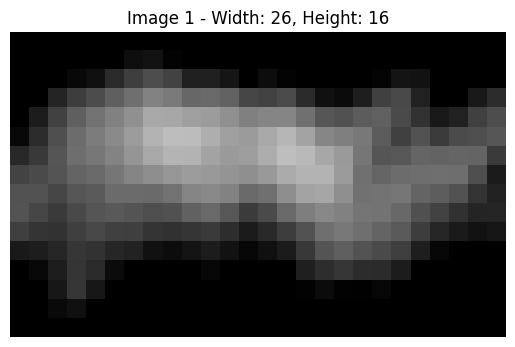

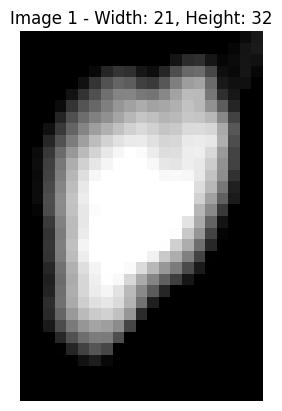

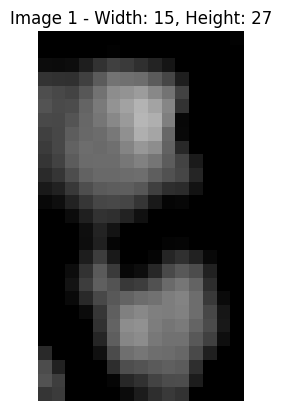

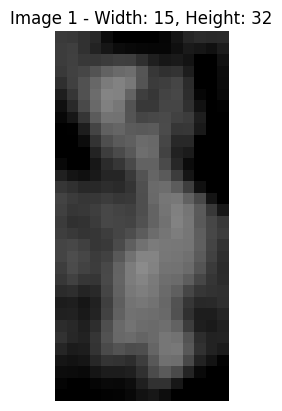

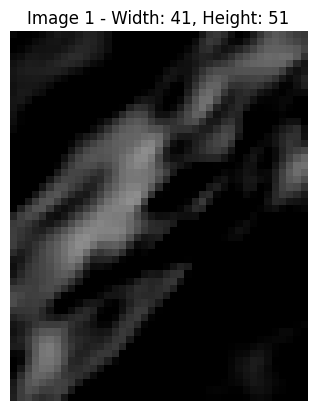

...

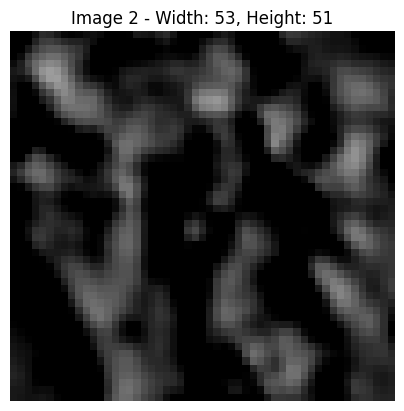

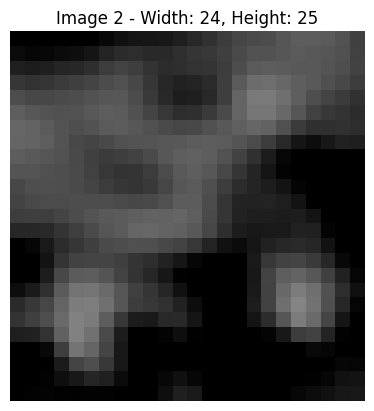

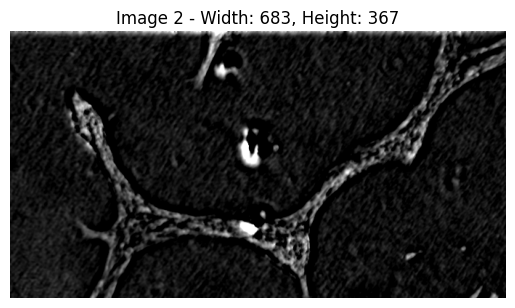

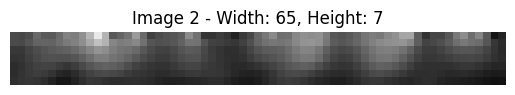

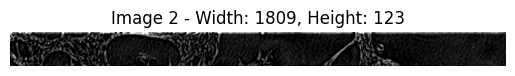

: 

In [106]:

dimensiones_crops = []

for i, ruta in enumerate(imagenes_rutas):
    original_image = cv2.imread(ruta)

    mask = imagenes_denoised[i]
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    for contour in contours:
        if cv2.contourArea(contour) > 0:  
            x, y, w, h = cv2.boundingRect(contour)  
            crop = original_image[y:y+h, x:x+w] 
            

            dimensiones_crops.append((w, h))
            if(i<2):
                mostrar_imagen(crop, title=f'Image {i+1} - Width: {w}, Height: {h}')


Mean Width: 54.254177660510116, Std Width: 120.75788962741815
Mean Height: 45.58575197889182, Std Height: 45.01537187745866


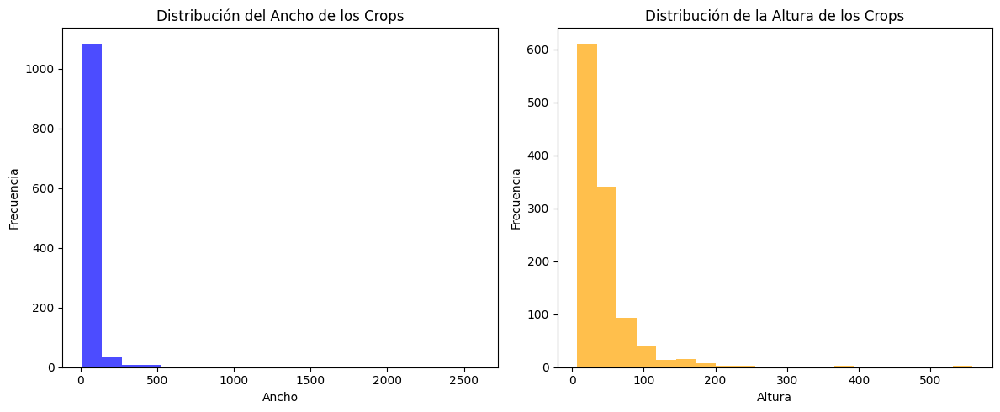

In [104]:

dimensiones_df = pd.DataFrame(dimensiones_crops, columns=['Width', 'Height'])

mean_width = dimensiones_df['Width'].mean()
mean_height = dimensiones_df['Height'].mean()
std_width = dimensiones_df['Width'].std()
std_height = dimensiones_df['Height'].std()

print(f'Mean Width: {mean_width}, Std Width: {std_width}')
print(f'Mean Height: {mean_height}, Std Height: {std_height}')

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(dimensiones_df['Width'], bins=20, color='blue', alpha=0.7)
plt.title('Distribución del Ancho de los Crops')
plt.xlabel('Ancho')
plt.ylabel('Frecuencia')

plt.subplot(1, 2, 2)
plt.hist(dimensiones_df['Height'], bins=20, color='orange', alpha=0.7)import matplotlib.pyplot as plt

# Convertir a un DataFrame para fácil análisis
dimensiones_df = pd.DataFrame(dimensiones_crops, columns=['Width', 'Height'])

# Calcular estimadores básicos
mean_width = dimensiones_df['Width'].mean()
mean_height = dimensiones_df['Height'].mean()
std_width = dimensiones_df['Width'].std()
std_height = dimensiones_df['Height'].std()

print(f'Mean Width: {mean_width}, Std Width: {std_width}')
print(f'Mean Height: {mean_height}, Std Height: {std_height}')

# Visualizar distribuciones
plt.figure(figsize=(12, 5))

# Gráfico de distribución del ancho
plt.subplot(1, 2, 1)
plt.hist(dimensiones_df['Width'], bins=20, color='blue', alpha=0.7)
plt.title('Distribución del Ancho de los Crops')
plt.xlabel('Ancho')
plt.ylabel('Frecuencia')

# Gráfico de distribución de la altura
plt.subplot(1, 2, 2)
plt.hist(dimensiones_df['Height'], bins=20, color='orange', alpha=0.7)
plt.title('Distribución de la Altura de los Crops')
plt.xlabel('Altura')
plt.ylabel('Frecuencia')

plt.tight_layout()
plt.show()

plt.title('Distribución de la Altura de los Crops')
plt.xlabel('Altura')
plt.ylabel('Frecuencia')

plt.tight_layout()
plt.show()
